In [ ]:
import os
HOME = os.getcwd()
print(HOME)

# Pip install method (recommended)

!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

from ultralytics import YOLO

from IPython.display import display, Image

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


EXPORTING DATASET

In [2]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="enxsoRHX3lhnLZMpyYkC")
project = rf.workspace("college-jcb9y").project("aircraft-damage-detection-a8z4k")
dataset = project.version(1).download("yolov8")

mkdir: cannot create directory ‘{HOME}/datasets’: No such file or directory
[Errno 2] No such file or directory: '{HOME}/datasets'
/content
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.20, to fix: `pip install ultralytics==8.0.134`


Extracting Dataset Version Zip to aircraft-damage-detection-1 in yolov8:: 100%|██████████| 5936/5936 [00:01<00:00, 3715.11it/s]


TRAINING

change data={dataset.location}/data.yaml to data="copy path of data.yml" after downloading data set

In [5]:
#%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data=/content/datasets/aircraft-damage-detection-1/data.yaml epochs=20 imgsz=500 plots=True

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/aircraft-damage-detection-1/data.yaml, epochs=20, patience=50, batch=16, imgsz=500, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dyna

Download best.pt into drive with name aircraft_damage_detection_model.pt

---

best.pt is in runs/detect/train/weights

TESTING

change model={HOME}/runs/detect/train/weights/best.pt to model="copy path of best.pt"

---


change source={dataset.location}/test/images to source="dataset/test/images copy path of this folder and paste"

In [8]:
#%cd {HOME}
!yolo task=detect mode=predict model=/content/runs/detect/train4/weights/best.pt conf=0.25 source=/content/datasets/aircraft-damage-detection-1/test/images save=True

2023-09-03 10:04:51.380386: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-03 10:04:52.720435: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
image 1/148 /content/datasets/aircraft-damage-detection-1/test/images/100_12_JPG.rf.2b18ea6eeb4fe48e68cfadfde874e2a6.jpg: 512x512 2 cracks, 1 dent, 11.2ms
image 2/148 /content/datasets/aircraft-damage-detection-1/test/images/100_25_JPG.rf.f75b10a5c226c12c0680605509065371.jpg: 512x512 1 dent, 11.2ms
image 3/148 /content/datasets/aircraft-damage-detection-1/test/images/100_6_JPG.rf.de0ec49532800

DISPLAYING OUTPUT

{HOME}/runs/detect/predict3 change this to path of predict after testing. Keep /*.jpg

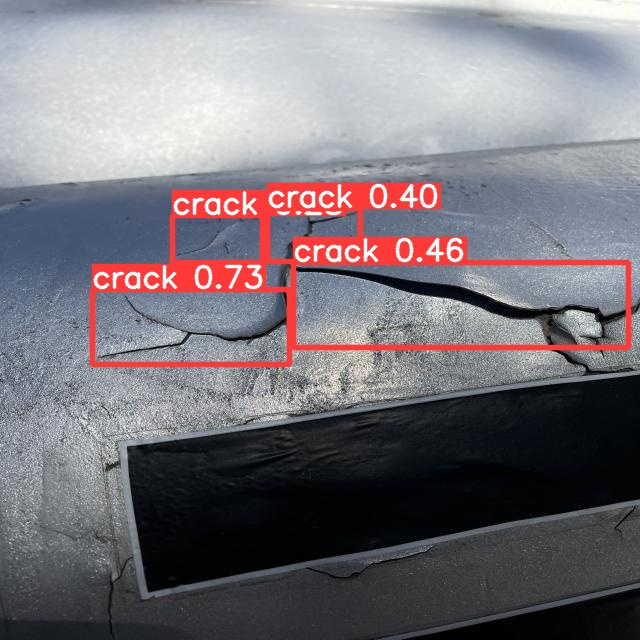

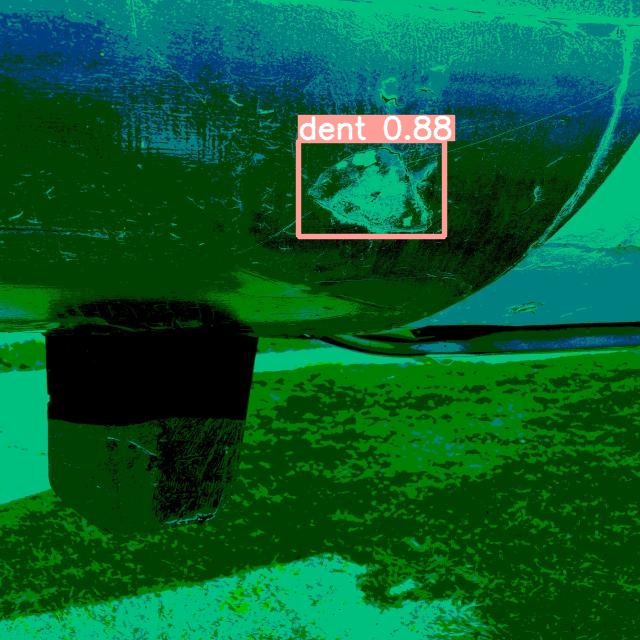

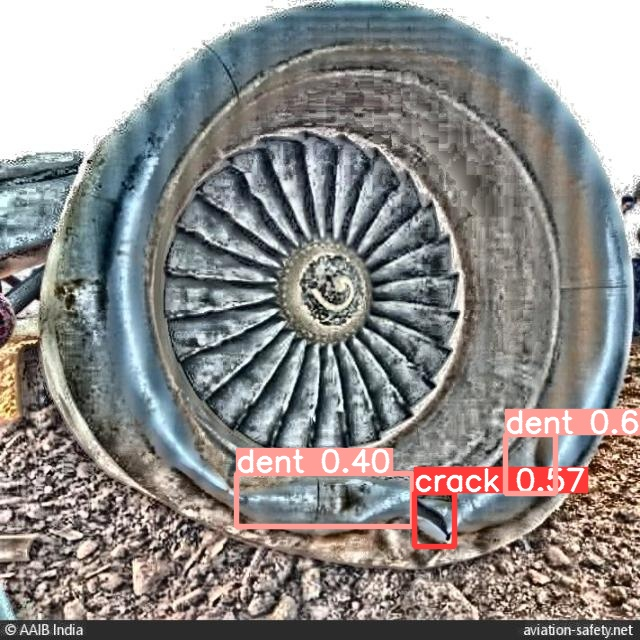

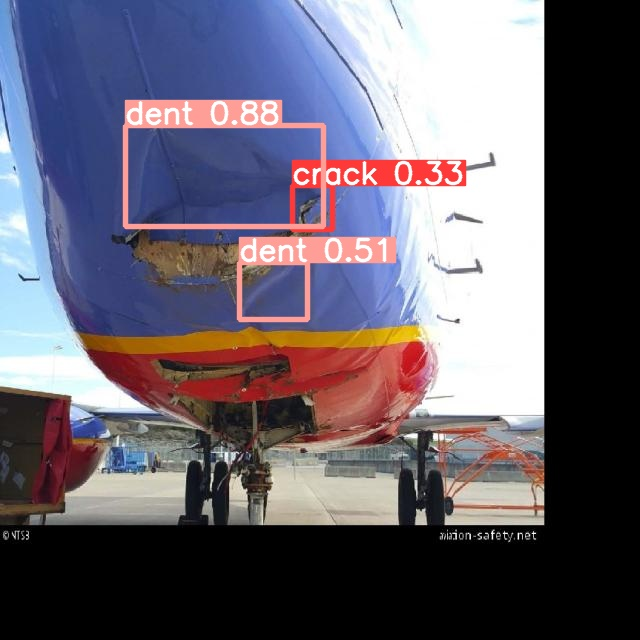

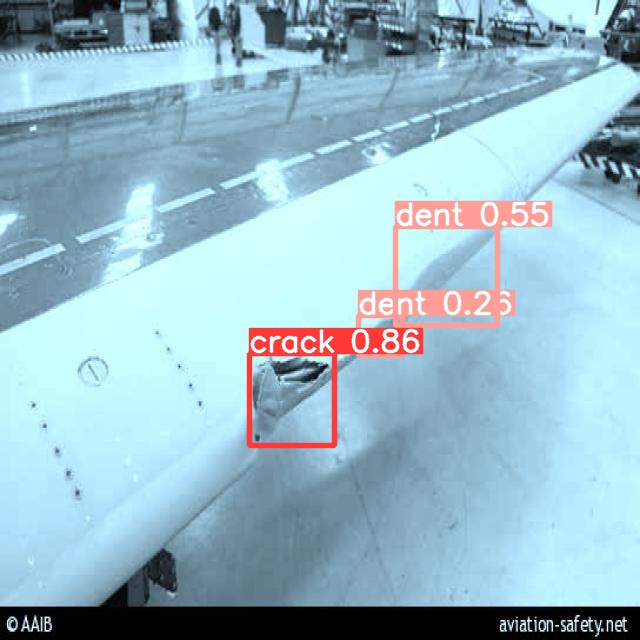

...

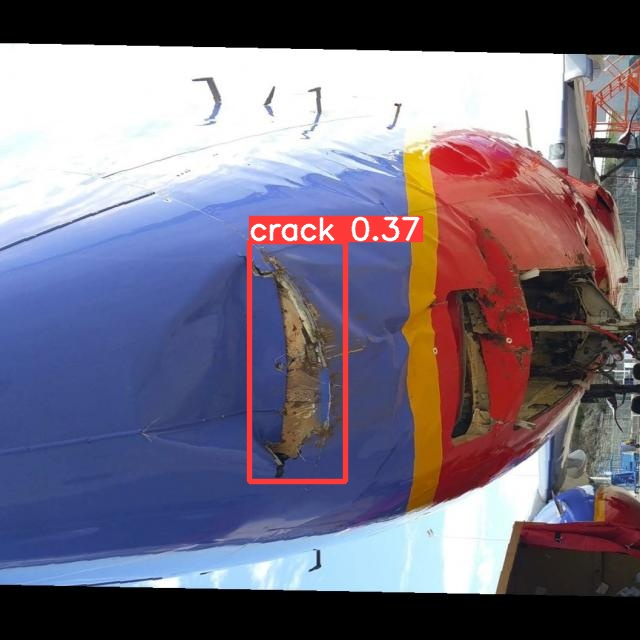

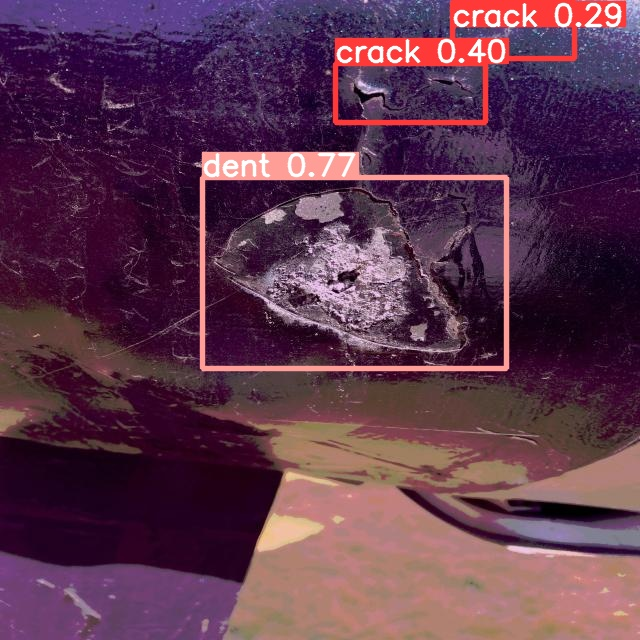

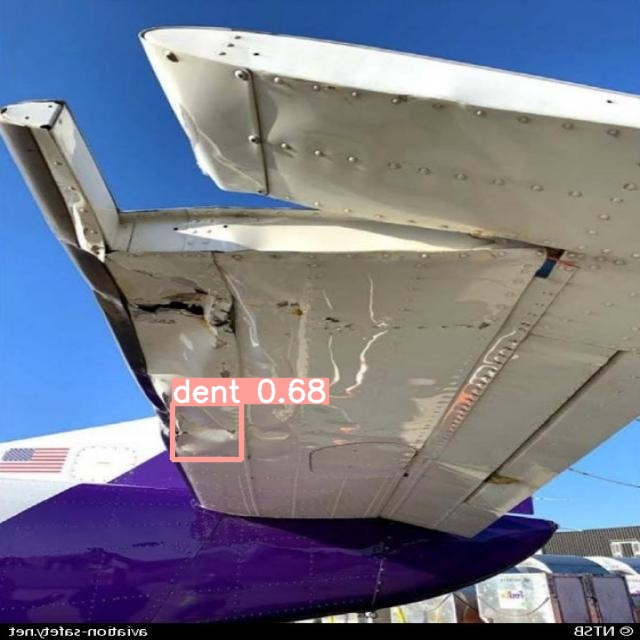

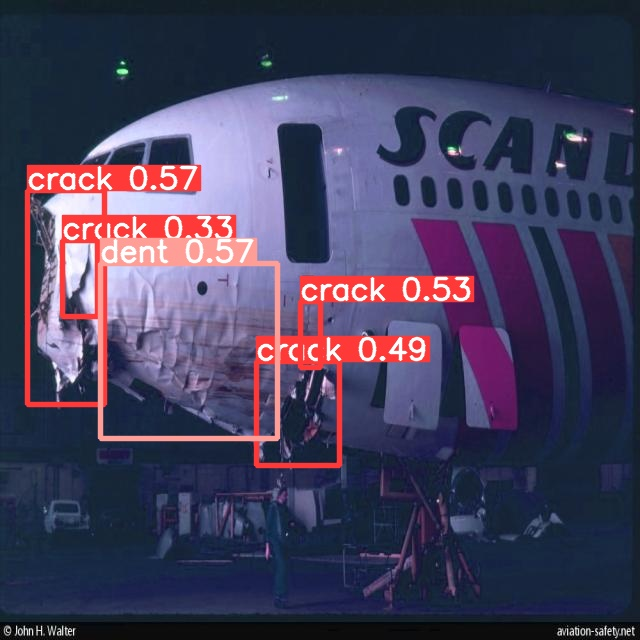

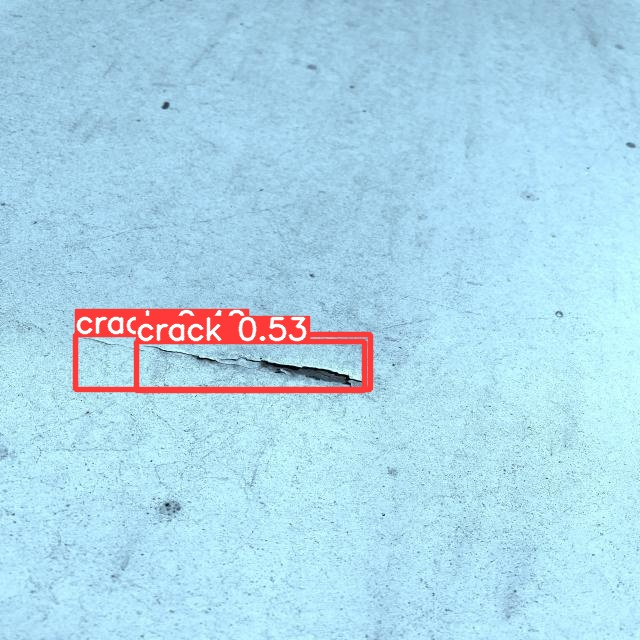

In [10]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg')[:]:
      display(Image(filename=image_path, width=600))
      print("\n")